<h1>Stock Market Prediction using Long Short Term Memory (LSTM)</h1>

### Import all the required libraries

In [1]:
import warnings
warnings.simplefilter("ignore")

In [2]:
import pandas as pd
import datetime as dt
from datetime import date
import matplotlib.pyplot as plt
import yfinance as yf
import numpy as np
import tensorflow as tf
from sklearn.preprocessing import MinMaxScaler
from sklearn.metrics import accuracy_score
from sklearn.metrics import mean_absolute_percentage_error


2023-12-28 23:40:00.790997: I external/local_tsl/tsl/cuda/cudart_stub.cc:31] Could not find cuda drivers on your machine, GPU will not be used.
2023-12-28 23:40:01.195570: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:9261] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2023-12-28 23:40:01.195664: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:607] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2023-12-28 23:40:01.274693: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1515] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
2023-12-28 23:40:01.434397: I external/local_tsl/tsl/cuda/cudart_stub.cc:31] Could not find cuda drivers on your machine, GPU will not be used.
2023-12-28 23:40:03.189963: W tensorflow/compiler/tf2tensorrt/utils/py_utils.

# Define start day to fetch the dataset from the yahoo finance library

---



In [3]:
# I'm using fetching TCS (Tata Consultancy Services Limited) online Data from Yahoo Finance 

In [4]:
START = "2002-01-01"
TODAY = date.today().strftime("%Y-%m-%d")

# Define a function to load the dataset

def load_data(ticker):
    data = yf.download(ticker, START, TODAY)
    data.reset_index(inplace=True)
    return data

In [5]:
data = load_data('TCS.NS')
df = data
df1 = data
df.head()

[*********************100%%**********************]  1 of 1 completed


,Date,Open,High,Low,Close,Adj Close,Volume
0,2002-08-12,38.724998,40.000000,38.724998,39.700001,28.128601,212976
1,2002-08-13,39.750000,40.387501,38.875000,39.162498,27.747757,153576
2,2002-08-14,39.250000,39.250000,35.724998,36.462502,25.834730,822776
3,2002-08-15,36.462502,36.462502,36.462502,36.462502,25.834730,0
4,2002-08-16,36.275002,38.000000,35.750000,36.375000,25.772724,811856


In [6]:
rows, columns = df.shape
print("Total Rows in Dataset :",rows)
print("Total Columns in Dataset :",columns)

Total Rows in Dataset : 5309
Total Columns in Dataset : 7


In [7]:
df = df.drop(['Date', 'Adj Close'], axis = 1)
df.head()

,Open,High,Low,Close,Volume
0,38.724998,40.000000,38.724998,39.700001,212976
1,39.750000,40.387501,38.875000,39.162498,153576
2,39.250000,39.250000,35.724998,36.462502,822776
3,36.462502,36.462502,36.462502,36.462502,0
4,36.275002,38.000000,35.750000,36.375000,811856


In [8]:
df.tail()

,Open,High,Low,Close,Volume
5304,3827.250000,3898.800049,3766.550049,3780.050049,2586083
5305,3756.250000,3806.699951,3743.350098,3787.500000,1517562
5306,3800.000000,3845.949951,3762.000000,3824.000000,2413058
5307,3819.850098,3834.000000,3790.149902,3795.550049,1285231
5308,3799.000000,3818.199951,3768.000000,3811.199951,1293976


In [9]:
df.sample(5)

,Open,High,Low,Close,Volume
4300,2053.000000,2082.000000,2045.500000,2078.500000,3334301
3661,1147.000000,1149.375000,1134.000000,1136.574951,2540510
1912,415.000000,418.000000,411.149994,412.524994,1997806
1415,215.649994,216.524994,210.562500,211.537506,1996828
1371,252.762497,255.725006,250.574997,251.300003,2318868


# Visualizing Closing Price

<Axes: >

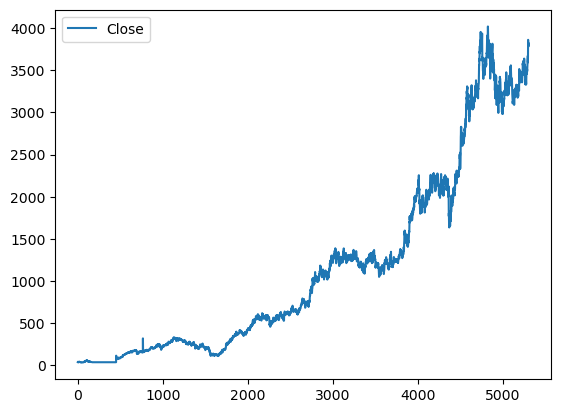

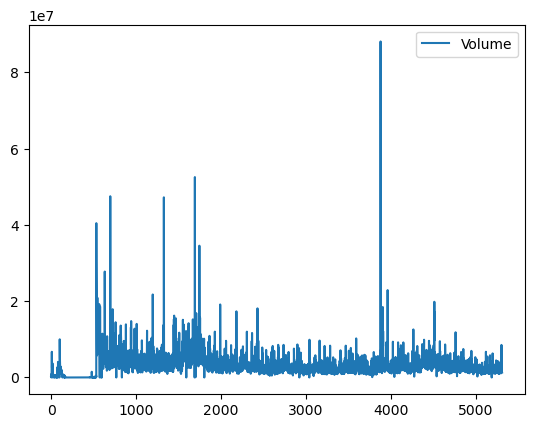

In [10]:
df[["Close"]].plot()
#Volume Plot
df[["Volume"]].plot()

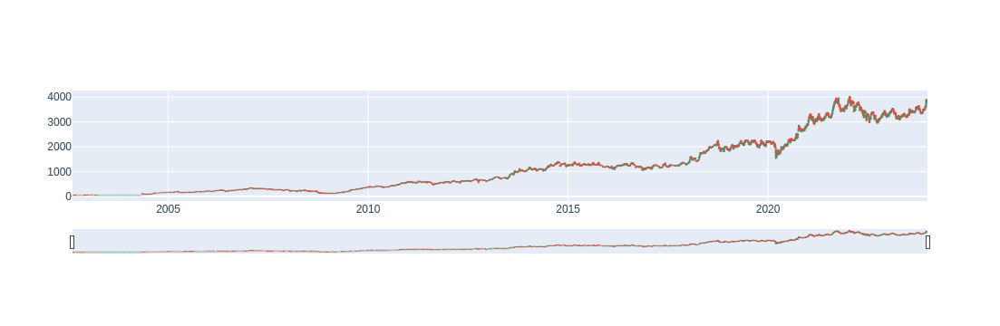

In [11]:
import plotly.graph_objects as go

fig = go.Figure(data=go.Ohlc(x = df1['Date'],
        open = df1['Open'],
        high = df1['High'],
        low = df1['Low'],
        close = df1['Close']))
fig.show()

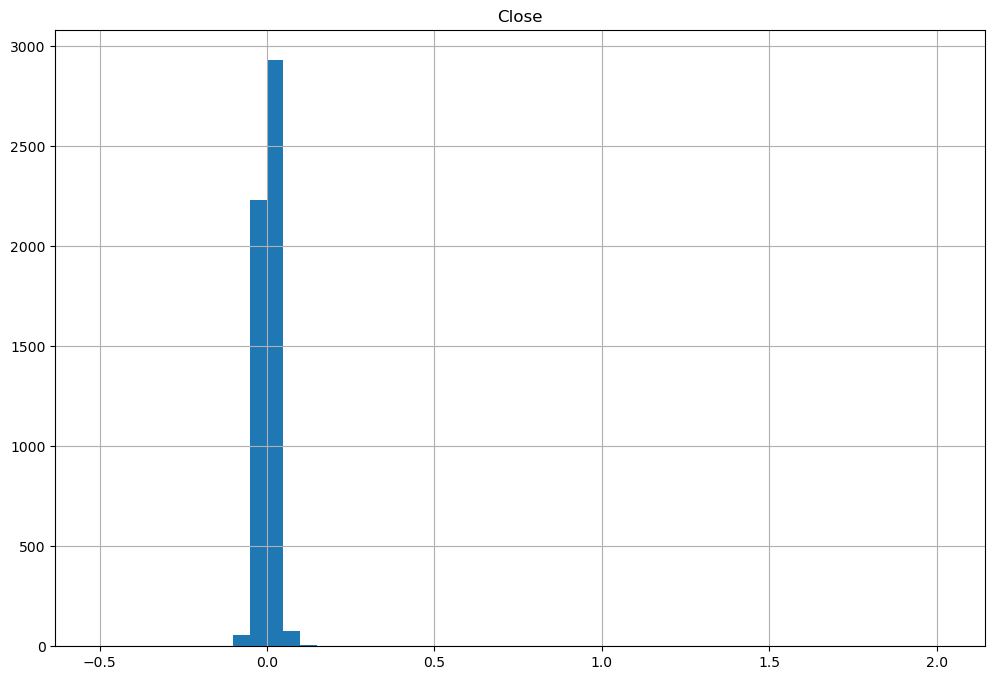

In [12]:
daily_close_px = df1[['Close']]
# Calculate the daily percentage change for `daily_close_px`
daily_pct_change = daily_close_px.pct_change()

# Plot the distributions
daily_pct_change.hist(bins=50, sharex=True, figsize=(12,8))

# Show the resulting plot
plt.show()

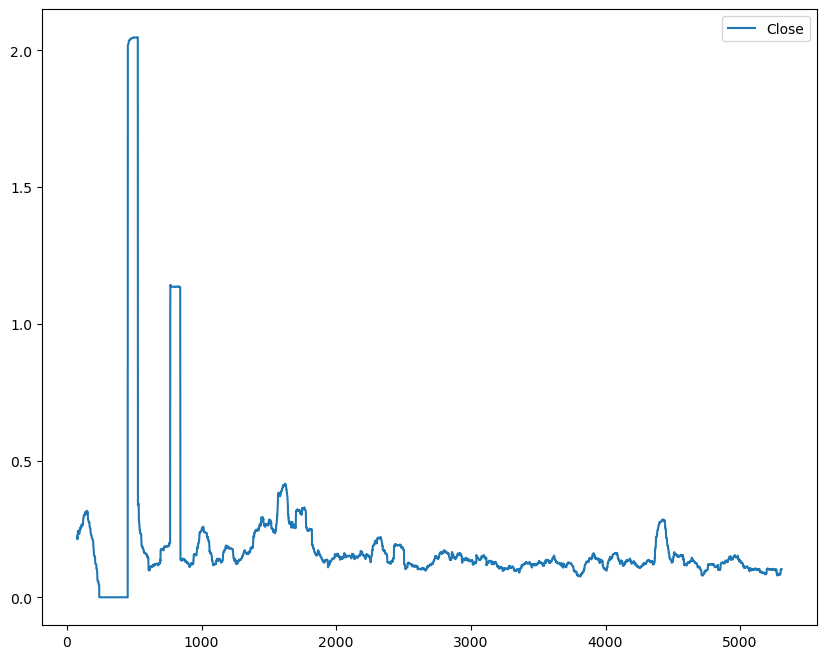

In [13]:
# Define the minumum of periods to consider 
min_periods = 75 

# Calculate the volatility
vol = daily_pct_change.rolling(min_periods).std() * np.sqrt(min_periods) 

# Plot the volatility
vol.plot(figsize=(10, 8))

# Show the plot
plt.show()

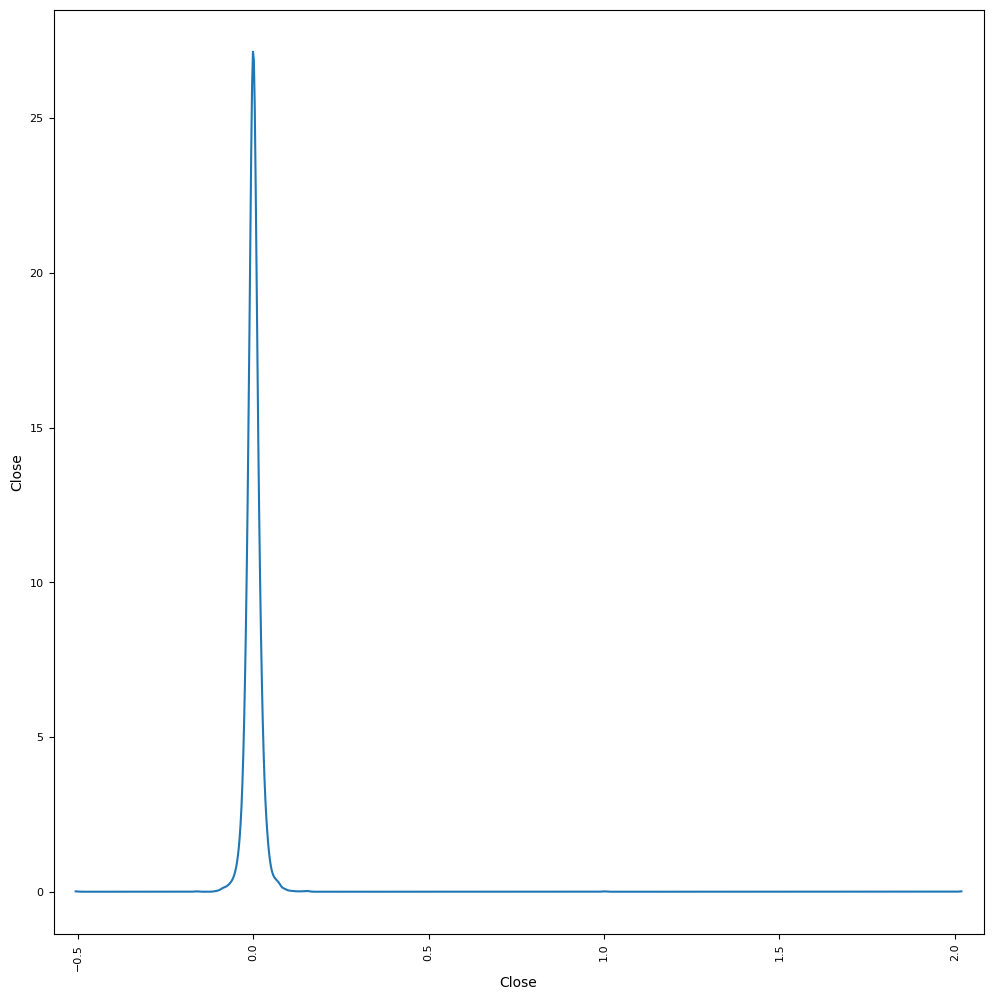

In [14]:
# Plot a scatter matrix with the `daily_pct_change` data 
pd.plotting.scatter_matrix(daily_pct_change, diagonal='kde', alpha=0.1,figsize=(12,12))

# Show the plot
plt.show()

### SMA chart plotting for 20, 50, 100, 200, 300, 400, 500 day moving averages

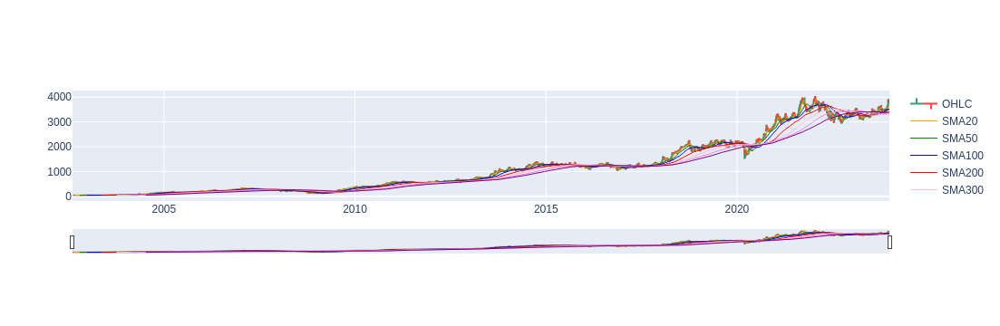

In [15]:
df1['SMA20'] = df1.Close.rolling(20).mean()
df1['SMA50'] = df1.Close.rolling(50).mean()
df1['SMA100'] = df1.Close.rolling(100).mean()
df1['SMA200'] = df1.Close.rolling(200).mean()
df1['SMA300'] = df1.Close.rolling(300).mean()
df1['SMA400'] = df1.Close.rolling(400).mean()
df1['SMA500'] = df1.Close.rolling(500).mean()

fig = go.Figure(data=[go.Ohlc(x = df1['Date'],
                              open = df1['Open'],
                              high = df1['High'],
                              low = df1['Low'],
                              close = df1['Close'], name = "OHLC"),
                      go.Scatter(x = df1.Date, y = df1.SMA20, line=dict(color='orange', width=1), name="SMA20"),
                      go.Scatter(x = df1.Date, y = df1.SMA50, line=dict(color='green', width=1), name="SMA50"),
                      go.Scatter(x = df1.Date, y = df1.SMA100, line=dict(color='blue', width=1), name="SMA100"),
                      go.Scatter(x = df1.Date, y = df1.SMA200, line=dict(color='red', width=1), name="SMA200"),
                      go.Scatter(x = df1.Date, y = df1.SMA300, line=dict(color='pink', width=1), name="SMA300"),
                      go.Scatter(x = df1.Date, y = df1.SMA400, line=dict(color='violet', width=1), name="SMA400"),
                      go.Scatter(x = df1.Date, y = df1.SMA500, line=dict(color='purple', width=1), name="SMA500")])
fig.show()

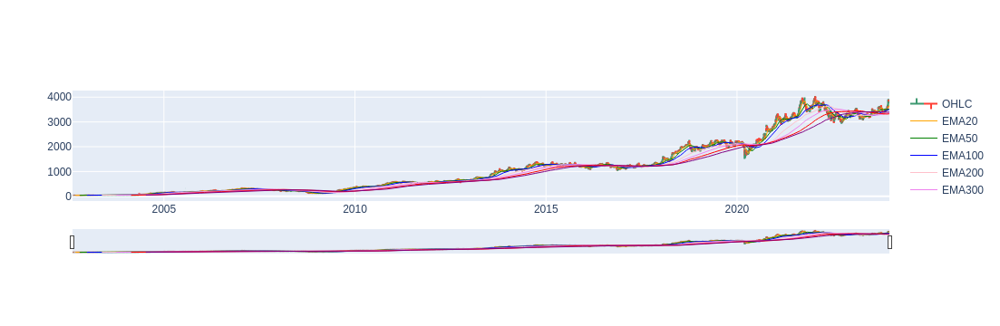

In [16]:
df1['EMA20'] = df1.Close.ewm(span=20, adjust=False).mean()
df1['EMA50'] = df1.Close.ewm(span=50, adjust=False).mean()
df1['EMA100'] = df1.Close.ewm(span=100, adjust=False).mean()
df1['EMA200'] = df1.Close.ewm(span=200, adjust=False).mean()
df1['EMA300'] = df1.Close.ewm(span=300, adjust=False).mean()
df1['EMA400'] = df1.Close.ewm(span=400, adjust=False).mean()
df1['EMA500'] = df1.Close.ewm(span=500, adjust=False).mean()

fig = go.Figure(data = [go.Ohlc(x = df1['Date'],
                              open = df1['Open'],
                              high = df1['High'],
                              low = df1['Low'],
                              close = df1['Close'], name = "OHLC"),
                      go.Scatter(x = df1.Date, y = df1.SMA20, line=dict(color='orange', width=1), name="EMA20"),
                      go.Scatter(x = df1.Date, y = df1.SMA50, line=dict(color='green', width=1), name="EMA50"),
                      go.Scatter(x = df1.Date, y = df1.SMA100, line=dict(color='blue', width=1), name="EMA100"),
                      go.Scatter(x = df1.Date, y = df1.SMA200, line=dict(color='pink', width=1), name="EMA200"),
                      go.Scatter(x = df1.Date, y = df1.SMA300, line=dict(color='violet', width=1), name="EMA300"),
                      go.Scatter(x = df1.Date, y = df1.SMA400, line=dict(color='red', width=1), name="EMA400"),
                      go.Scatter(x = df1.Date, y = df1.SMA500, line=dict(color='purple', width=1), name="EMA500")])
fig.show()

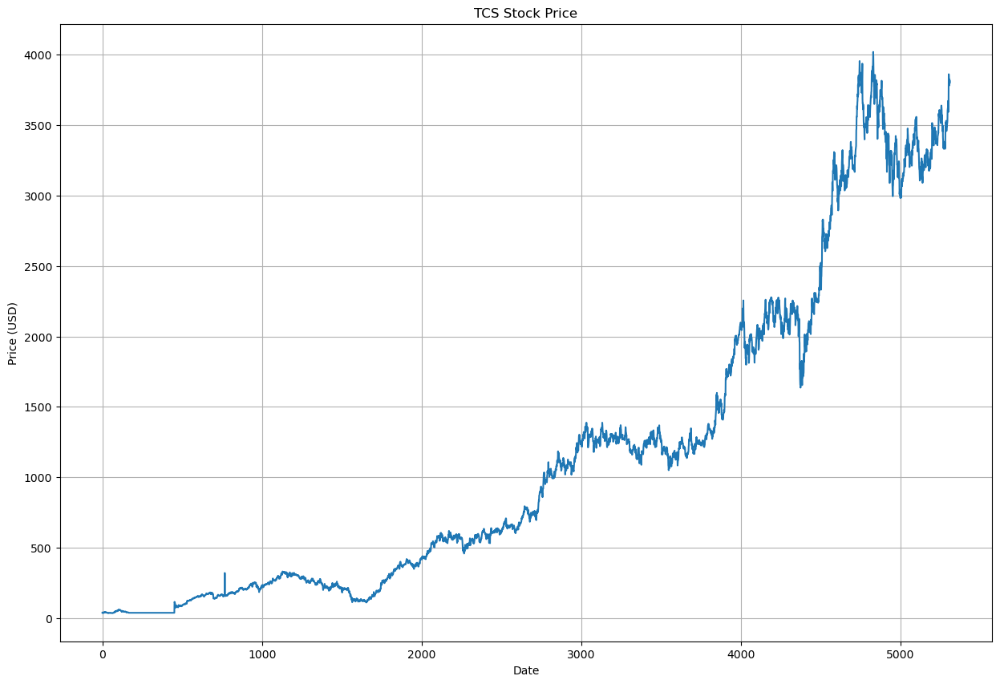

In [17]:
plt.figure(figsize=(15, 10))
plt.plot(df['Close'])
plt.title("TCS Stock Price")
plt.xlabel("Date")
plt.ylabel("Price (USD)")
plt.grid(True)
plt.show()

In [18]:
df

,Open,High,Low,Close,Volume
0,38.724998,40.000000,38.724998,39.700001,212976
1,39.750000,40.387501,38.875000,39.162498,153576
2,39.250000,39.250000,35.724998,36.462502,822776
3,36.462502,36.462502,36.462502,36.462502,0
4,36.275002,38.000000,35.750000,36.375000,811856
...,...,...,...,...,...
5304,3827.250000,3898.800049,3766.550049,3780.050049,2586083
5305,3756.250000,3806.699951,3743.350098,3787.500000,1517562
5306,3800.000000,3845.949951,3762.000000,3824.000000,2413058
5307,3819.850098,3834.000000,3790.149902,3795.550049,1285231


# Plotting moving averages of 100 day

---



In [19]:
moving_average_100 = df.Close.rolling(200).mean()

In [20]:
moving_average_100

0               NaN
1               NaN
2               NaN
3               NaN
4               NaN
           ...     
5304    3374.338247
5305    3376.616497
5306    3379.172246
5307    3381.221497
5308    3383.670247
Name: Close, Length: 5309, dtype: float64

In [21]:
moving_average_100.describe()

count    5110.000000
mean     1133.830330
std      1063.894758
min        38.387501
25%       241.267747
50%       726.603124
75%      1758.078746
max      3640.561985
Name: Close, dtype: float64

Text(0.5, 1.0, 'Graph Of Moving Averages Of 100 Days')

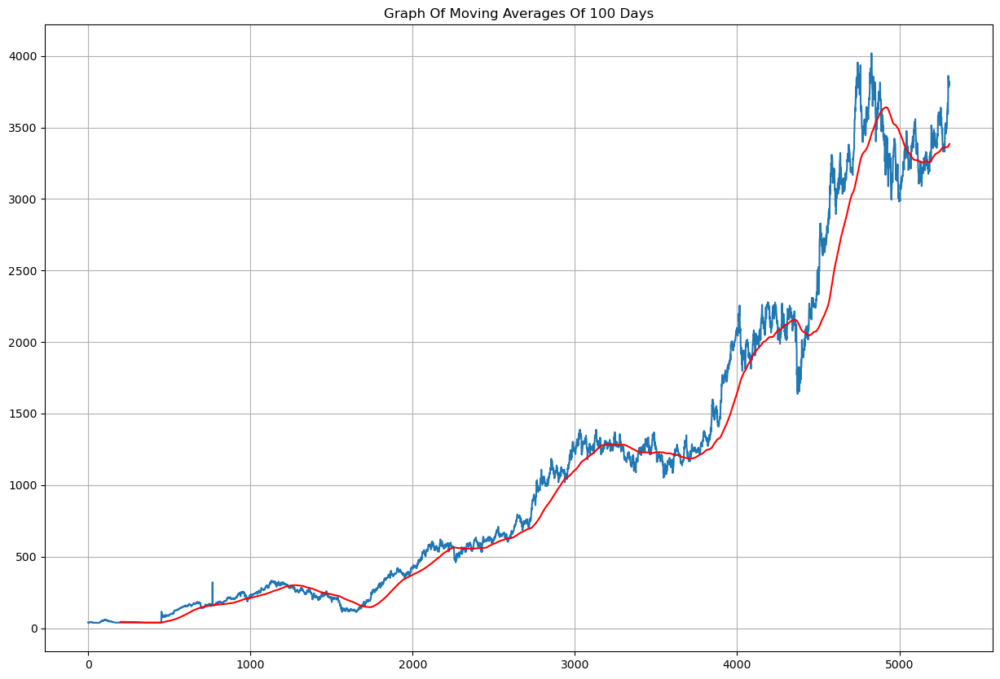

In [22]:
plt.figure(figsize = (15,10))
plt.plot(df.Close)
plt.plot(moving_average_100, 'r')
plt.grid(True)
plt.title('Graph Of Moving Averages Of 100 Days')

# Defining 200 days moving averages and plotting comparision graph with 100 days moving averages

---



In [23]:
moving_average_200 = df.Close.rolling(200).mean()

In [24]:
moving_average_200

0               NaN
1               NaN
2               NaN
3               NaN
4               NaN
           ...     
5304    3374.338247
5305    3376.616497
5306    3379.172246
5307    3381.221497
5308    3383.670247
Name: Close, Length: 5309, dtype: float64

In [25]:
moving_average_200.describe

<bound method NDFrame.describe of 0               NaN
1               NaN
2               NaN
3               NaN
4               NaN
           ...     
5304    3374.338247
5305    3376.616497
5306    3379.172246
5307    3381.221497
5308    3383.670247
Name: Close, Length: 5309, dtype: float64>

Text(0.5, 1.0, 'Comparision Of 100 Days And 200 Days Moving Averages')

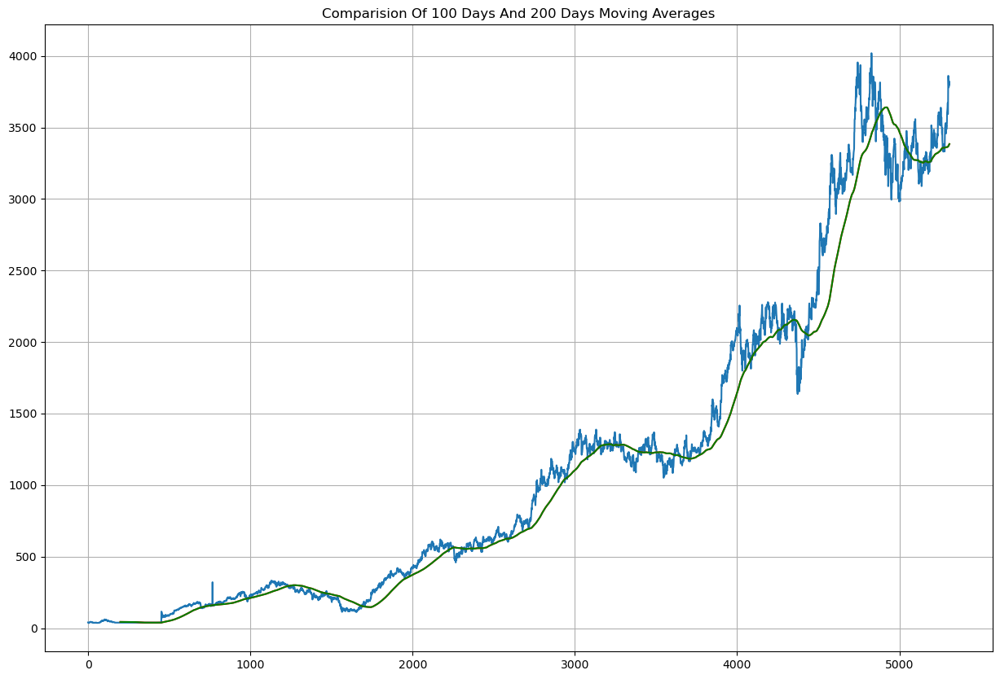

In [26]:
plt.figure(figsize = (15,10))
plt.plot(df.Close)
plt.plot(moving_average_100, 'r')
plt.plot(moving_average_200, 'g')
plt.grid(True)
plt.title('Comparision Of 100 Days And 200 Days Moving Averages')

In [27]:
df.shape # i have dropped two Columns from loaded Dataset like Date and Adj Close

(5309, 5)

# Spliting the dataset into training (67%) and testing (33%) set

In [28]:
# Splitting data into training and testing 

train = pd.DataFrame(data[0:int(len(data)*0.67)])
test = pd.DataFrame(data[int(len(data)*0.67): int(len(data))])

print(train.shape)
print(test.shape)

(3557, 21)
(1752, 21)


In [29]:
train.head()

,Date,Open,High,Low,Close,Adj Close,Volume,SMA20,SMA50,SMA100,...,SMA300,SMA400,SMA500,EMA20,EMA50,EMA100,EMA200,EMA300,EMA400,EMA500
0,2002-08-12,38.724998,40.000000,38.724998,39.700001,28.128601,212976,NaN,NaN,NaN,...,NaN,NaN,NaN,39.700001,39.700001,39.700001,39.700001,39.700001,39.700001,39.700001
1,2002-08-13,39.750000,40.387501,38.875000,39.162498,27.747757,153576,NaN,NaN,NaN,...,NaN,NaN,NaN,39.648810,39.678922,39.689357,39.694652,39.696429,39.697320,39.697855
2,2002-08-14,39.250000,39.250000,35.724998,36.462502,25.834730,822776,NaN,NaN,NaN,...,NaN,NaN,NaN,39.345352,39.552788,39.625459,39.662492,39.674941,39.681186,39.684939
3,2002-08-15,36.462502,36.462502,36.462502,36.462502,25.834730,0,NaN,NaN,NaN,...,NaN,NaN,NaN,39.070795,39.431600,39.562826,39.630651,39.653596,39.665133,39.672075
4,2002-08-16,36.275002,38.000000,35.750000,36.375000,25.772724,811856,NaN,NaN,NaN,...,NaN,NaN,NaN,38.814053,39.311734,39.499701,39.598257,39.631812,39.648723,39.658913


In [30]:
train.tail()

,Date,Open,High,Low,Close,Adj Close,Volume,SMA20,SMA50,SMA100,...,SMA300,SMA400,SMA500,EMA20,EMA50,EMA100,EMA200,EMA300,EMA400,EMA500
3552,2016-11-21,1063.099976,1070.000000,1052.500000,1066.449951,924.593872,1793366,1136.617499,1171.703501,1225.988752,...,1227.106751,1240.391626,1248.70965,1119.390066,1168.004245,1201.703014,1220.838312,1224.331149,1218.152192,1204.280186
3553,2016-11-22,1066.000000,1088.724976,1061.025024,1067.500000,925.504456,1318860,1129.276251,1168.213000,1223.437002,...,1226.374001,1239.829126,1248.27500,1114.448155,1164.062902,1199.045529,1219.312558,1223.289082,1217.400809,1203.734157
3554,2016-11-23,1074.500000,1081.474976,1063.599976,1078.175049,934.759460,1275808,1122.492505,1165.371001,1221.349003,...,1225.683168,1239.222814,1247.85065,1110.993573,1160.694751,1196.652054,1217.908205,1222.324869,1216.706417,1203.232923
3555,2016-11-24,1077.449951,1103.800049,1068.500000,1094.224976,948.674561,3026234,1117.242505,1164.034500,1219.812002,...,1225.057168,1238.627689,1247.44735,1109.396564,1158.088093,1194.623795,1216.677526,1221.473707,1216.095536,1202.797762
3556,2016-11-25,1106.000000,1153.625000,1096.099976,1150.175049,997.182129,4276148,1114.845007,1163.513501,1218.994003,...,1224.662085,1238.185939,1247.15925,1113.280229,1157.777778,1193.743622,1216.015810,1220.999961,1215.766756,1202.587691


In [31]:
train.sample(5)

,Date,Open,High,Low,Close,Adj Close,Volume,SMA20,SMA50,SMA100,...,SMA300,SMA400,SMA500,EMA20,EMA50,EMA100,EMA200,EMA300,EMA400,EMA500
2058,2010-10-21,487.024994,496.924988,485.000000,493.100006,382.249969,3752354,476.611249,453.750999,426.199500,...,374.058417,325.090000,285.415475,476.459540,457.326237,435.225716,401.277129,371.995875,349.090566,331.519395
2120,2011-01-20,590.000000,609.375000,590.000000,606.099976,470.741516,4545208,576.311246,554.383000,515.760499,...,428.262250,386.249500,337.570550,575.257013,554.692804,521.725570,471.512525,432.951904,403.022264,379.736735
153,2003-03-13,42.212502,42.724998,41.000000,41.924999,29.705076,390112,45.473750,49.991000,47.649375,...,NaN,NaN,NaN,45.267904,47.573099,47.105592,44.988859,43.690226,42.886022,42.346951
1170,2007-03-16,310.350006,314.462494,303.787506,309.412506,224.759613,4224284,310.409381,317.559504,300.423127,...,253.930818,236.268464,221.501276,309.623874,309.904374,299.100152,276.952676,258.617347,242.530867,228.115224
3227,2015-07-22,1280.500000,1284.500000,1260.525024,1264.025024,1069.319336,1320628,1280.772498,1282.233499,1283.352251,...,1252.931499,1211.223124,1162.453799,1277.082674,1279.024342,1278.566016,1261.820507,1227.520644,1185.933873,1142.886762


In [32]:
test.head()

,Date,Open,High,Low,Close,Adj Close,Volume,SMA20,SMA50,SMA100,...,SMA300,SMA400,SMA500,EMA20,EMA50,EMA100,EMA200,EMA300,EMA400,EMA500
3557,2016-11-28,1147.0,1159.724976,1125.949951,1141.300049,989.487671,1924296,1111.457507,1162.749001,1217.892504,...,1224.146752,1237.719814,1246.83540,1115.948783,1157.131592,1192.705135,1215.272369,1220.470394,1215.395351,1202.343030
3558,2016-11-29,1137.5,1146.000000,1126.275024,1129.925049,979.625610,1442296,1107.986261,1162.063003,1216.426254,...,1223.570502,1237.259939,1246.47695,1117.279856,1156.064669,1191.461965,1214.423142,1219.868764,1214.969065,1202.053936
3559,2016-11-30,1132.5,1147.375000,1121.150024,1138.025024,986.648376,3445832,1106.137512,1161.554004,1215.302253,...,1223.118169,1236.876501,1246.16715,1119.255587,1155.357232,1190.403808,1213.662962,1219.324951,1214.585304,1201.798332
3560,2016-12-01,1138.5,1145.000000,1127.025024,1131.724976,981.185974,1123052,1105.122510,1160.571504,1214.148503,...,1222.657668,1236.612251,1245.85685,1120.443148,1154.430477,1189.241851,1212.847658,1218.742892,1214.172036,1201.518598
3561,2016-12-02,1129.0,1135.400024,1102.599976,1110.925049,963.153076,1998032,1102.682513,1158.675505,1212.831254,...,1222.126919,1236.353564,1245.47325,1119.536662,1152.724382,1187.691023,1211.833503,1218.026494,1213.657088,1201.156947


In [33]:
test.tail()

,Date,Open,High,Low,Close,Adj Close,Volume,SMA20,SMA50,SMA100,...,SMA300,SMA400,SMA500,EMA20,EMA50,EMA100,EMA200,EMA300,EMA400,EMA500
5304,2023-12-20,3827.250000,3898.800049,3766.550049,3780.050049,3780.050049,2586083,3613.032495,3511.515000,3491.664500,...,3354.508665,3323.052623,3395.608696,3644.695999,3552.512366,3491.774595,3428.860636,3396.828466,3365.839114,3326.522304
5305,2023-12-21,3756.250000,3806.699951,3743.350098,3787.500000,3787.500000,1517562,3625.900000,3514.497998,3495.656499,...,3356.829832,3323.999748,3396.042996,3658.296380,3561.727567,3497.630543,3432.429187,3399.424290,3367.942161,3328.362535
5306,2023-12-22,3800.000000,3845.949951,3762.000000,3824.000000,3824.000000,2413058,3641.687500,3518.400000,3499.927500,...,3359.236665,3325.022498,3396.527795,3674.077677,3572.012761,3504.093305,3436.325414,3402.245391,3370.216764,3330.341127
5307,2023-12-26,3819.850098,3834.000000,3790.149902,3795.550049,3795.550049,1285231,3658.609998,3522.113003,3504.329001,...,3361.672166,3326.069373,3396.950195,3685.646474,3580.778929,3509.864726,3439.899789,3404.858711,3372.338127,3332.198249
5308,2023-12-27,3799.000000,3818.199951,3768.000000,3811.199951,3811.199951,1293976,3675.662500,3527.486001,3508.226501,...,3363.980999,3326.968373,3397.458795,3697.603948,3589.815047,3515.831760,3443.594318,3407.558653,3374.526964,3334.110431


In [34]:
test.sample(5)

,Date,Open,High,Low,Close,Adj Close,Volume,SMA20,SMA50,SMA100,...,SMA300,SMA400,SMA500,EMA20,EMA50,EMA100,EMA200,EMA300,EMA400,EMA500
4476,2020-08-19,2276.350098,2284.600098,2252.500000,2256.600098,2122.070068,2843005,2257.264990,2183.912983,2039.275493,...,2101.543334,2083.503378,2064.349501,2250.551974,2187.660364,2121.233141,2085.679021,2062.332345,2029.047163,1989.160935
5113,2023-03-10,3312.899902,3337.250000,3290.000000,3331.000000,3289.323242,1024404,3418.905005,3392.502007,3337.480002,...,3401.662828,3455.539366,3399.470695,3390.017757,3385.112685,3350.396423,3340.311736,3329.741484,3292.794901,3237.066875
5188,2023-07-03,3314.300049,3318.800049,3268.750000,3272.300049,3255.389404,1687264,3234.237488,3245.025996,3274.064500,...,3274.502331,3378.814495,3409.514093,3239.866411,3245.884893,3258.452357,3280.462936,3288.496339,3271.249361,3233.491362
5198,2023-07-17,3510.000000,3549.899902,3477.050049,3491.699951,3473.655762,2743228,3287.107483,3274.313994,3257.640493,...,3267.279330,3374.322244,3410.347893,3315.407416,3279.974189,3274.353768,3286.573383,3292.087641,3274.794381,3237.816269
5302,2023-12-18,3858.100098,3929.000000,3830.149902,3859.199951,3859.199951,2521612,3584.709998,3503.805000,3483.640999,...,3349.152831,3321.188873,3394.883096,3610.895388,3532.083283,3479.279149,3421.402764,3391.442804,3361.495014,3322.734636


# Using MinMax scaler for normalization of the dataset

---



In [35]:
from sklearn.preprocessing import MinMaxScaler
scaler = MinMaxScaler(feature_range=(0,1))

In [36]:
train_close = train.iloc[:, 4:5].values
test_close = test.iloc[:, 4:5].values

In [37]:
data_training_array = scaler.fit_transform(train_close)
data_training_array

array([[3.12378868e-03],
       [2.72638213e-03],
       [7.30118150e-04],
       ...,
       [7.70928485e-01],
       [7.82795125e-01],
       [8.24162251e-01]])

In [38]:
x_train = []
y_train = [] 

for i in range(100, data_training_array.shape[0]):
    x_train.append(data_training_array[i-100: i])
    y_train.append(data_training_array[i, 0])

x_train, y_train = np.array(x_train), np.array(y_train) 

In [39]:
x_train.shape

(3457, 100, 1)

# ML Model (LSTM)

---



In [40]:
from tensorflow.keras.layers import Dense, Dropout, LSTM
from tensorflow.keras.models import Sequential

In [41]:
model = Sequential()
model.add(LSTM(units = 50, activation = 'relu', return_sequences=True
              ,input_shape = (x_train.shape[1], 1)))
model.add(Dropout(0.2))


model.add(LSTM(units = 60, activation = 'relu', return_sequences=True))
model.add(Dropout(0.3))


model.add(LSTM(units = 80, activation = 'relu', return_sequences=True))
model.add(Dropout(0.4))


model.add(LSTM(units = 120, activation = 'relu'))
model.add(Dropout(0.5))

model.add(Dense(units = 1))

In [42]:
model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 lstm (LSTM)                 (None, 100, 50)           10400     
                                                                 
 dropout (Dropout)           (None, 100, 50)           0         
                                                                 
 lstm_1 (LSTM)               (None, 100, 60)           26640     
                                                                 
 dropout_1 (Dropout)         (None, 100, 60)           0         
                                                                 
 lstm_2 (LSTM)               (None, 100, 80)           45120     
                                                                 
 dropout_2 (Dropout)         (None, 100, 80)           0         
                                                                 
 lstm_3 (LSTM)               (None, 120)               9

# Training the model

---



In [43]:
import tensorflow as tf
model.compile(optimizer = 'adam', loss = 'mean_squared_error', metrics=[tf.keras.metrics.MeanAbsoluteError()])
model.fit(x_train, y_train,epochs = 100)

Epoch 1/100
109/109 [==============================] - 34s 258ms/step - loss: 0.0254 - mean_absolute_error: 0.0955
Epoch 2/100
109/109 [==============================] - 30s 272ms/step - loss: 0.0098 - mean_absolute_error: 0.0669
Epoch 3/100
109/109 [==============================] - 30s 274ms/step - loss: 0.0058 - mean_absolute_error: 0.0497
Epoch 4/100
109/109 [==============================] - 28s 255ms/step - loss: 0.0063 - mean_absolute_error: 0.0511
Epoch 5/100
109/109 [==============================] - 38s 349ms/step - loss: 0.0048 - mean_absolute_error: 0.0440
Epoch 6/100
109/109 [==============================] - 26s 241ms/step - loss: 0.0046 - mean_absolute_error: 0.0435
Epoch 7/100
109/109 [==============================] - 27s 252ms/step - loss: 0.0048 - mean_absolute_error: 0.0443
Epoch 8/100
109/109 [==============================] - 26s 242ms/step - loss: 0.0040 - mean_absolute_error: 0.0412
Epoch 9/100
109/109 [==============================] - 28s 259ms/step - loss: 0.

In [44]:
model.save('keras_model.h5')

In [45]:
test_close.shape

(1752, 1)

In [46]:
past_100_days = pd.DataFrame(train_close[-100:])

In [47]:
test_df = pd.DataFrame(test_close)

**Defining the final dataset for testing by including last 100 coloums of the training dataset to get the prediction from the 1st column of the testing dataset.**

---


In [48]:
final_df = pd.concat([past_100_days, test_df], ignore_index=True)

In [49]:
final_df.head()

,0
0,1251.449951
1,1276.550049
2,1250.425049
3,1247.099976
4,1242.650024


In [50]:
input_data = scaler.fit_transform(final_df)
input_data

array([[0.06766715],
       [0.07612242],
       [0.0673219 ],
       ...,
       [0.93426142],
       [0.92467771],
       [0.92994957]])

In [51]:
input_data.shape

(1852, 1)

# Testing the model

---



In [52]:
x_test = []
y_test = []
for i in range(100, input_data.shape[0]):
   x_test.append(input_data[i-100: i])
   y_test.append(input_data[i, 0])

In [53]:
x_test, y_test = np.array(x_test), np.array(y_test)
print(x_test.shape)
print(y_test.shape)

(1752, 100, 1)
(1752,)


# Making prediction and plotting the graph of predicted vs actual values

---



In [54]:
# Making predictions

y_pred = model.predict(x_test)

55/55 [==============================] - 5s 86ms/step


In [55]:
y_pred.shape

(1752, 1)

In [56]:
y_test

array([0.03056183, 0.02673003, 0.0294586 , ..., 0.93426142, 0.92467771,
       0.92994957])

In [57]:
y_pred

array([[0.11212508],
       [0.11159423],
       [0.11180729],
       ...,
       [0.8013097 ],
       [0.8074249 ],
       [0.8124113 ]], dtype=float32)

In [58]:
scaler.scale_

array([0.00033686])

In [59]:
scale_factor = 1/0.00041967
y_pred = y_pred * scale_factor
y_test = y_test * scale_factor

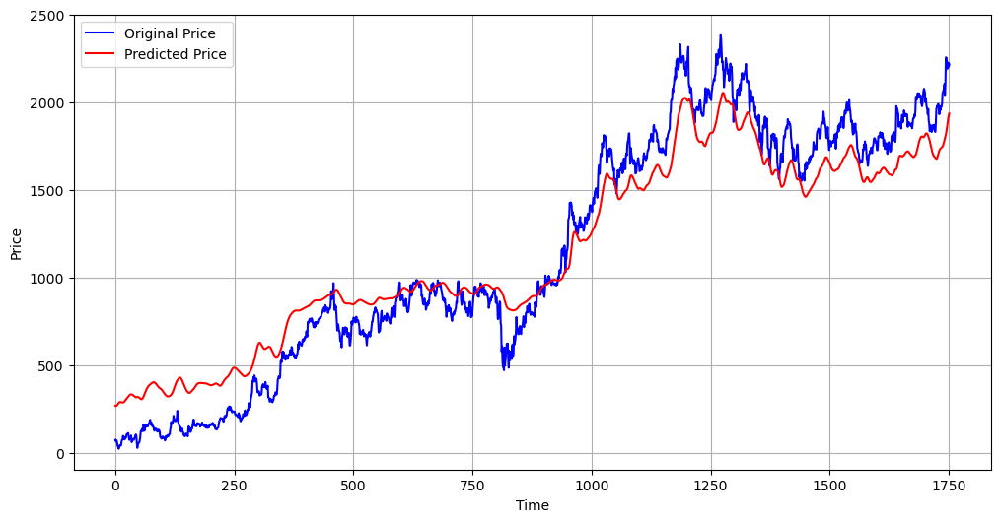

In [60]:
plt.figure(figsize = (12,6))
plt.plot(y_test, 'b', label = "Original Price")
plt.plot(y_pred, 'r', label = "Predicted Price")
plt.xlabel('Time')
plt.ylabel('Price')
plt.legend()
plt.grid(True)
plt.show()

# Model evaluation

Calculation of mean absolute error

In [61]:
from sklearn.metrics import mean_absolute_error

mae = mean_absolute_error(y_test, y_pred)
mae_percentage = (mae / np.mean(y_test)) * 100
print("Mean absolute error on test set: {:.2f}%".format(mae_percentage))

Mean absolute error on test set: 14.20%


Calculation of R2 score

In [62]:
from sklearn.metrics import r2_score

# Actual values
actual = y_test

# Predicted values
predicted = y_pred

# Calculate the R2 score
r2 = r2_score(actual, predicted)

print("R2 score:", r2)

R2 score: 0.9272452174290756


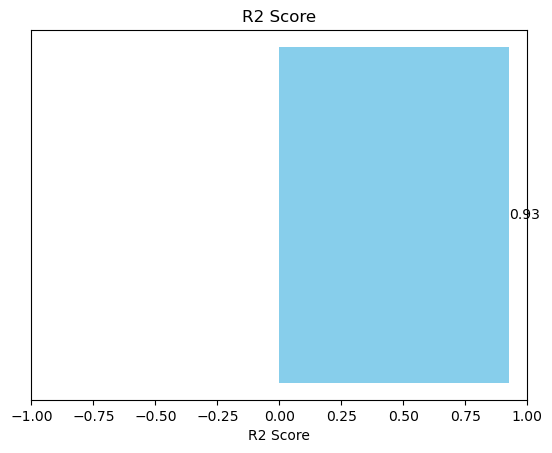

In [63]:
# Plotting the R2 score
fig, ax = plt.subplots()
ax.barh(0, r2, color='skyblue')
ax.set_xlim([-1, 1])
ax.set_yticks([])
ax.set_xlabel('R2 Score')
ax.set_title('R2 Score')

# Adding the R2 score value on the bar
ax.text(r2, 0, f'{r2:.2f}', va='center', color='black')

plt.show()

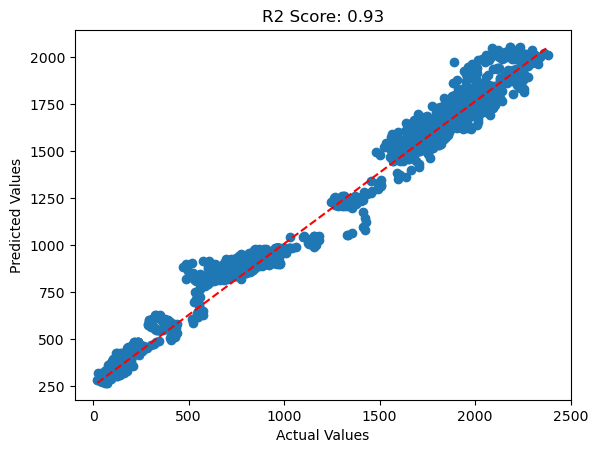

In [64]:
plt.scatter(actual, predicted)
plt.plot([min(actual), max(actual)], [min(predicted), ma<b><x(predicted)], 'r--')
plt.xlabel('Actual Values')
plt.ylabel('Predicted Values')
plt.title(f'R2 Score: {r2:.2f}')
plt.show()

In [65]:
print("The Error Rate of Prediction Model:",(mean_absolute_percentage_error(y_pred,y_test))*100)
print("The Accuracy of Prediction Model:",(1-mean_absolute_percentage_error(y_pred,y_test))*100)

The Error Rate of Prediction Model: 20.53598044414941
The Accuracy of Prediction Model: 79.46401955585058


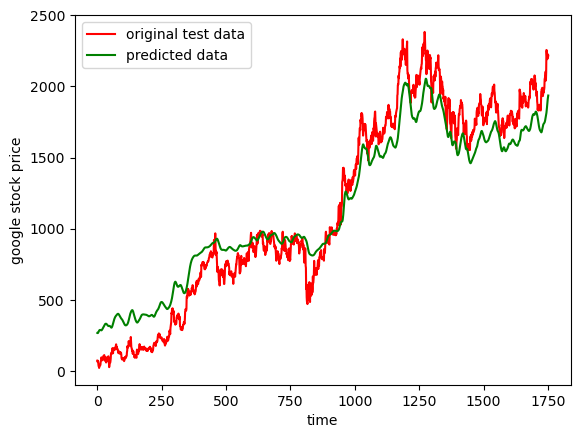

In [66]:
plt.plot(y_test,color='red',label='original test data')
plt.plot(y_pred,color='green',label='predicted data')
plt.xlabel('time')
plt.ylabel('google stock price')
plt.legend()
plt.show()